<a href="https://www.kaggle.com/code/catalystcooperative/02-state-hourly-electricity-demand?scriptVersionId=257368813" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
import geopandas as gpd

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
sns.set()
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (16, 10)
matplotlib.rcParams["figure.dpi"] = 150
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_colwidth", 1000)

## Where is the PUDL data?
- PUDL data can be read from the [PUDL AWS Open Data Registry](https://registry.opendata.aws/catalyst-cooperative-pudl/) S3 bucket.
- The bucket URL is `s3://pudl.catalyst.coop` and the contents are organized by version.
- The most recent successful nightly build outputs are at `/nightly`
- We can define a little helper function below that takes a table name and pulls the most recent nightly version of that table.
- Because this data is being read from a remote location, there's a bit of a lag for each query.
- How long that lag is will depend on the speed of your network connection and the size of the data you're trying to read.

In [2]:
# If you wanted to pull a different version of the data, swap the version string in for /nightly here
PARQUET_PATH = "s3://pudl.catalyst.coop/nightly"


def read_parquet(table_name: str) -> pd.DataFrame | gpd.GeoDataFrame:
    """A helper function to read PUDL Parquet files."""
    try:
        return gpd.read_parquet(f"{PARQUET_PATH}/{table_name}.parquet").convert_dtypes()
    except (ValueError, TypeError):
        return pd.read_parquet(f"{PARQUET_PATH}/{table_name}.parquet").convert_dtypes()

# Read state hourly electricity demand estimates from PUDL

In [3]:
%%time
state_demand = read_parquet("out_ferc714__hourly_estimated_state_demand")
state_demand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8045504 entries, 0 to 8045503
Data columns (total 4 columns):
 #   Column             Dtype         
---  ------             -----         
 0   state_id_fips      string        
 1   datetime_utc       datetime64[ms]
 2   demand_mwh         Float32       
 3   scaled_demand_mwh  Float32       
dtypes: Float32(2), datetime64[ms](1), string(1)
memory usage: 199.5 MB
CPU times: user 5.89 s, sys: 2.01 s, total: 7.91 s
Wall time: 1min 28s


# Read state geometries and IDs from Census DP1

In [4]:
%%time
states = read_parquet("out_censusdp1tract__states")
states = states.convert_dtypes().sort_values("state").set_index("state_id_fips")

CPU times: user 207 ms, sys: 88.2 ms, total: 295 ms
Wall time: 29.4 s


In [5]:
def plot_demand_timeseries(
    df: pd.DataFrame,
    window: int = None,
    title: str = None,
) -> None:
    """Make a timeseries plot of predicted and reference demand.

    Args:
        df: Predicted demand with columns `datetime_utc` and any of
            `demand_mwh` and `scaled_demand_mwh`.
        window: Width of window (in rows) to use to compute rolling means,
            or `None` to plot raw values.
        title: Plot title.
    """
    plt.figure(figsize=(16, 8))
    # Plot predicted
    for field, color in [("demand_mwh", "red"), ("scaled_demand_mwh", "blue")]:
        y = df[field]
        if window:
            y = y.rolling(window).mean()
        plt.plot(df["datetime_utc"], y, color=color, alpha=0.5, label=f"{field}")
    if title:
        plt.title(title)
    plt.ylabel("Hourly Electricity Demand (MW)")
    plt.legend()
    plt.show()

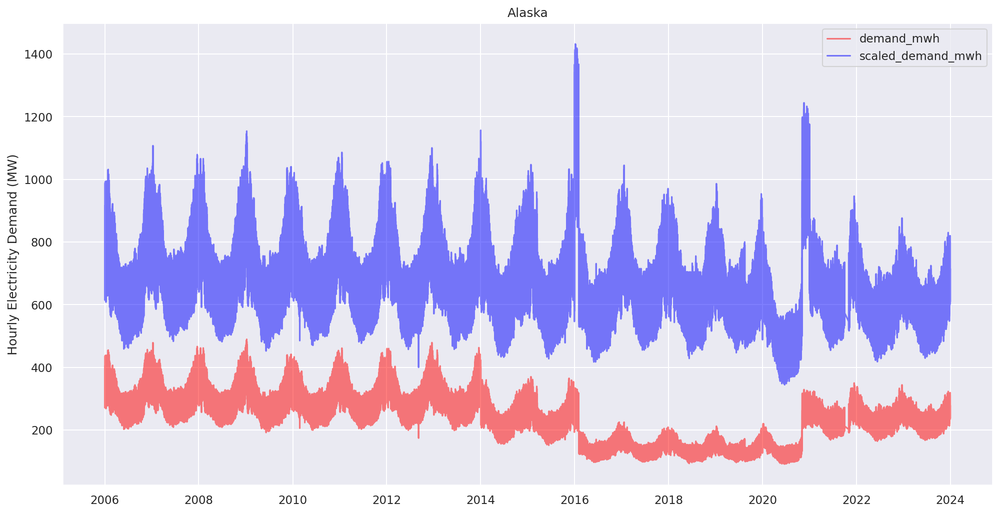

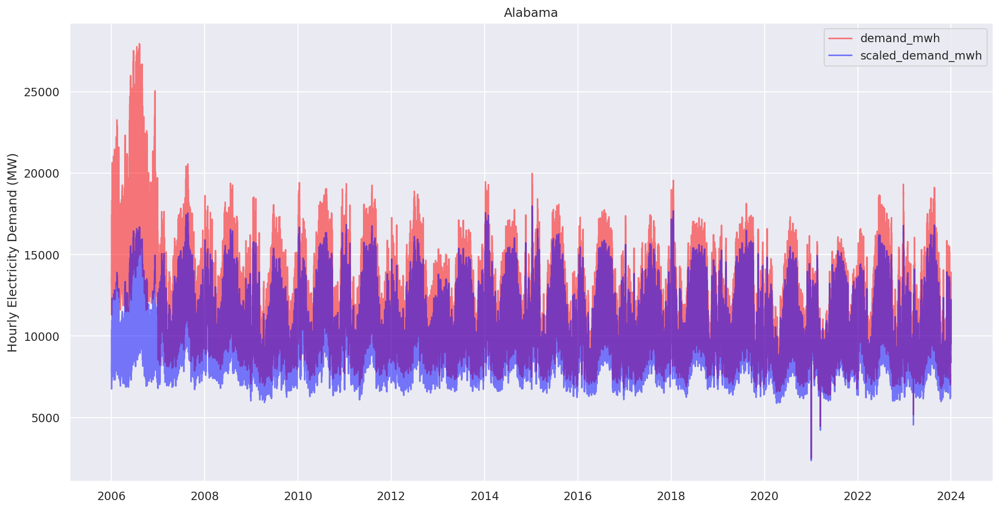

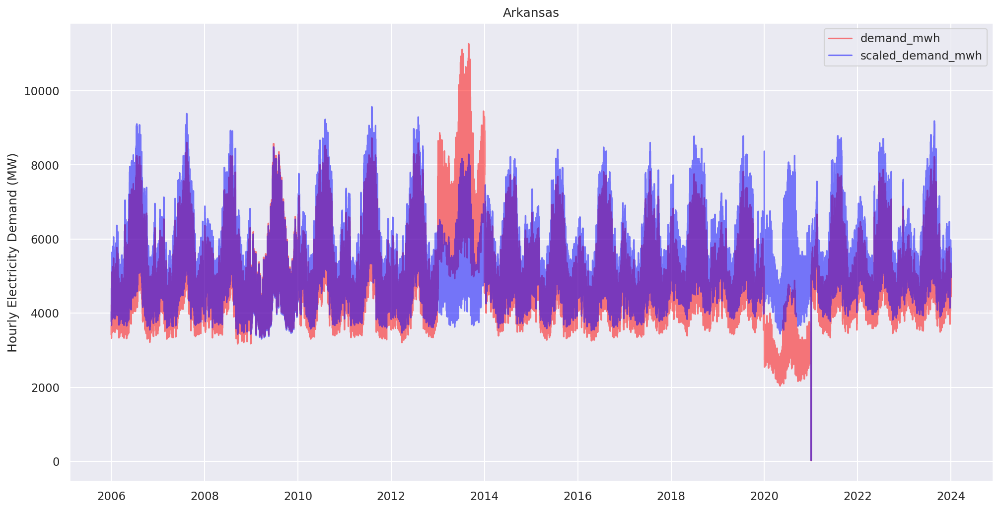

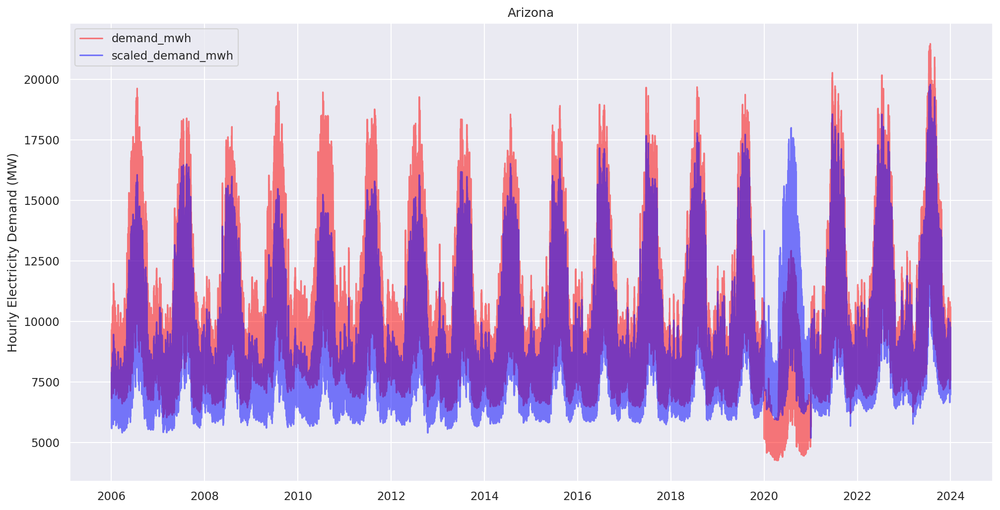

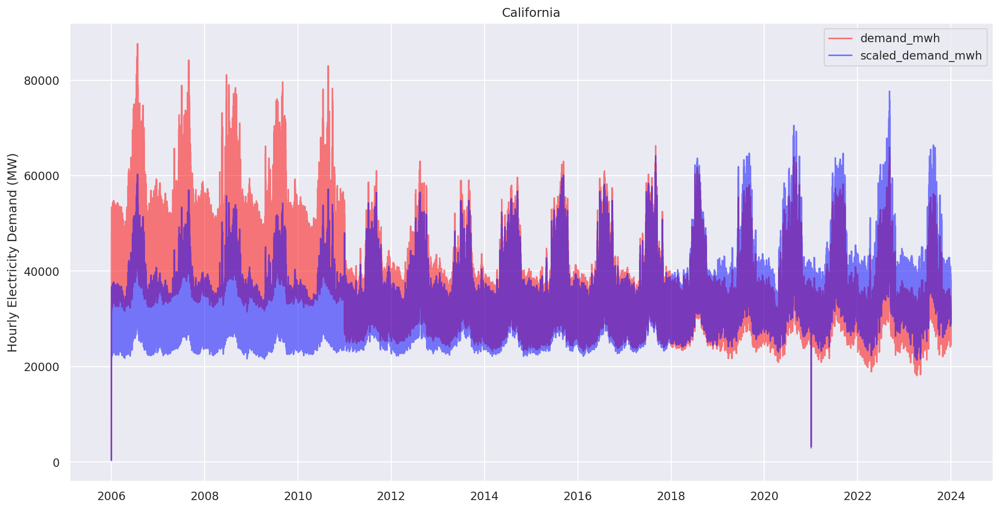

...

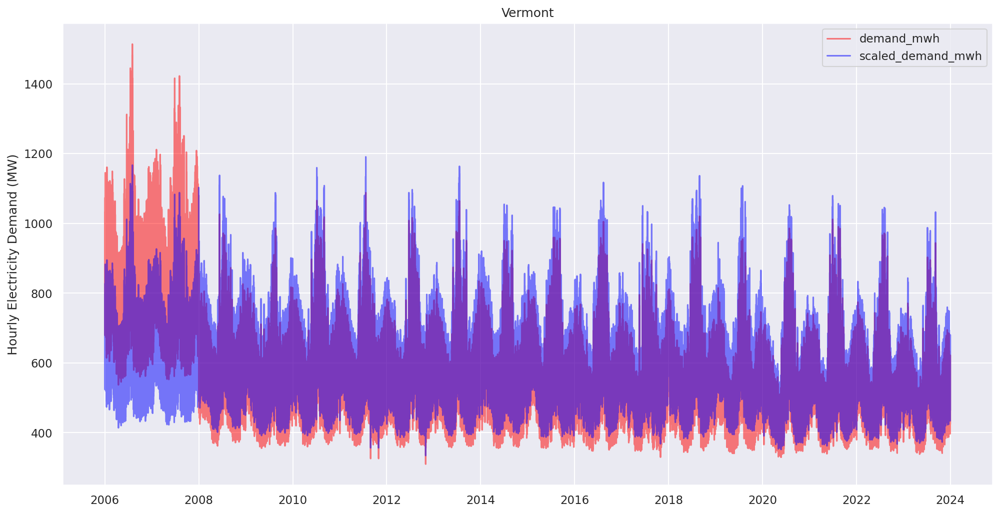

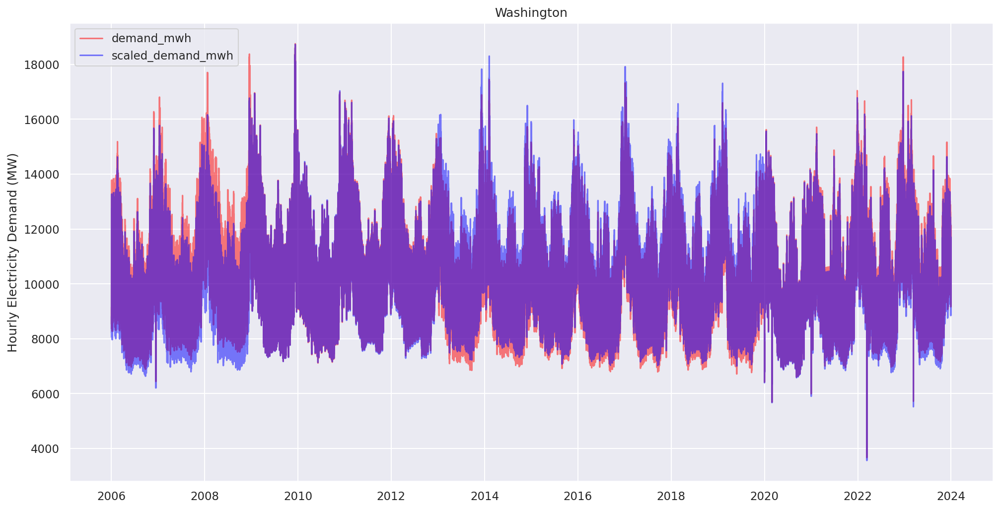

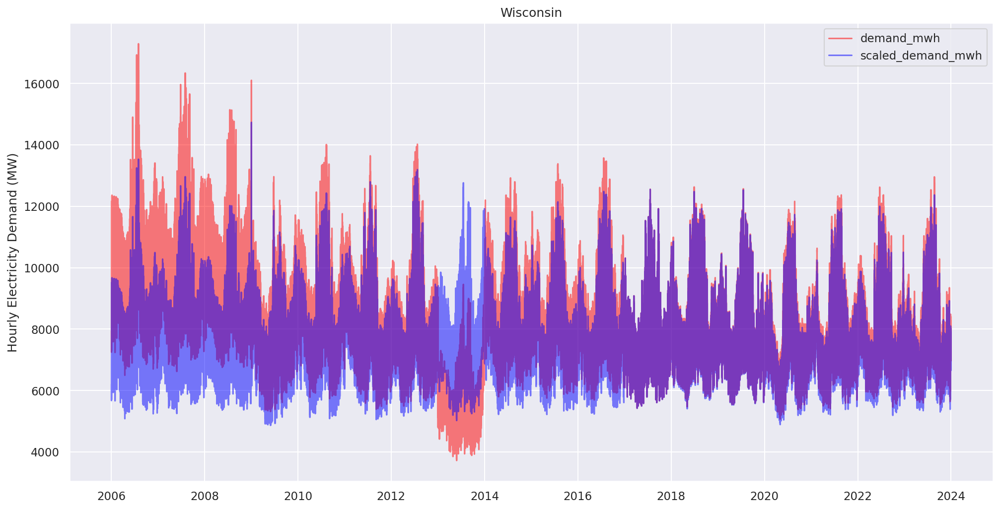

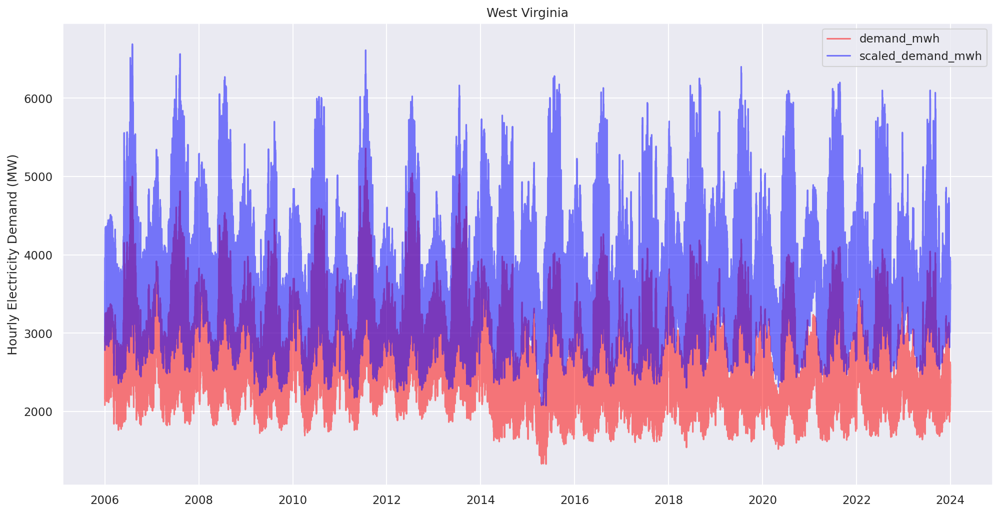

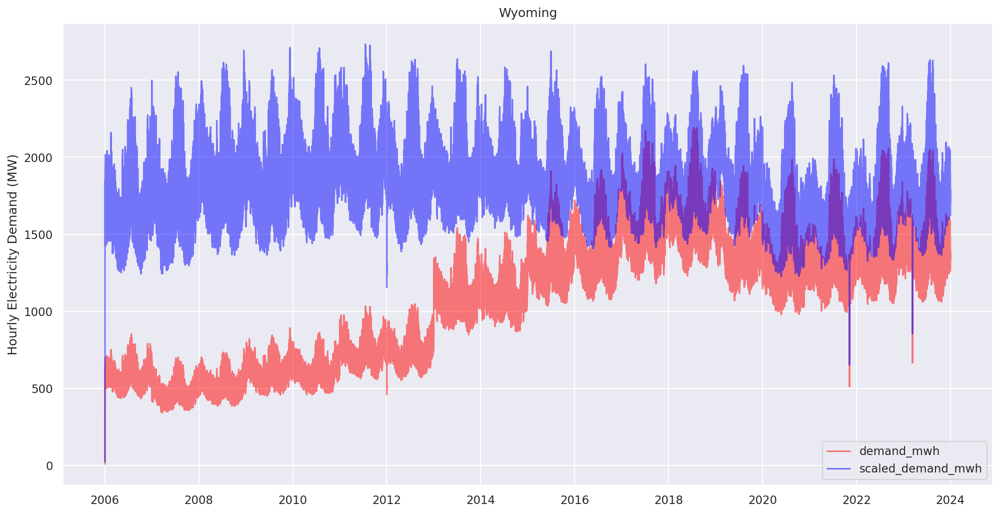

CPU times: user 2min 32s, sys: 6.27 s, total: 2min 38s
Wall time: 2min 38s


In [6]:
%%time
for state_id_fips in states.index:
    df = state_demand[state_demand.state_id_fips == state_id_fips]
    if df.empty:
        continue
    state_name = states.at[state_id_fips, "state_name"]
    title = state_name
    plot_demand_timeseries(df, title=state_name)

In [7]:
states.loc[states.state == "CA", ["state", "state_name"]]

,state,state_name
state_id_fips,,
06,CA,California


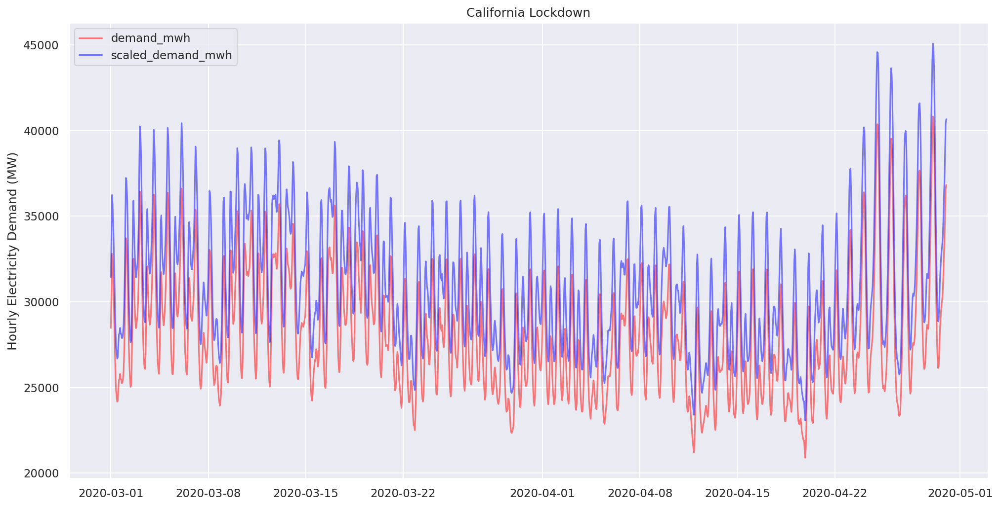

In [8]:
start_date = pd.to_datetime("2020-03-01")
end_date = pd.to_datetime("2020-04-30")
california_covid19 = state_demand[
    (state_demand.state_id_fips == "06")
    & state_demand.datetime_utc.between(start_date, end_date)
]
plot_demand_timeseries(california_covid19, title="California Lockdown")